# Term project - MNIST visualization<br>
Deep neural network 구현 및 Visualization과 이를 통한 Neural network에 대한 이해 향상


## MNIST dataset 불러 오기 및 시각화

1. data에 대한 pca(2d라? 겹치는 경유 확인가능) + tsne결과 확인하기
    둘의 차이 확인하기
2. layer들의 dimension 확인

• Input image에 대한 PCA, t-SNE 결과
• hidden vector (a[0], z[1], a[1], z[2], a[2])에 대한 PCA, ,t-SNE결과
    ->  총 10장
• 결과 분석 (자유롭게)


In [85]:
from __future__ import print_function

import torch
from torch import nn
from torch import optim
import numpy as np

import time

# dataset
import torchvision 
from torchvision import datasets
from torchvision import transforms

import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# sklearn
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns


%matplotlib inline

## Hyperparameter
modeling 과정에서 직접 설정하는 값입니다.<br>
- batch_size
- learning rate : 학습률(gradient를 통해 weight를 이동, 변화시키는 정도)
- epoch_nums : 학습을 반복하는 횟수
- batch size : 한번의 batch마다 주어지는 data sample의 size (batch: 나누어진 dataset)
- momentum : weight의 update과정에서 관성, 가속도를 주어 감소, 증가하는 방향으로 더 많은 변화를 준다.

In [86]:
batch_size = 12
# batch_size = 32
learning_rate = 0.01
# learning_rate = 0.05
# learning_rate = 0.1
epoch_num = 10
# epoch_num = 20

## MNIST dataset
### torchvision.datasets.MNIST = (root="", train="", dawnload="",trasform ="")
root = "data의 경로" <br>
train = True(학습용 데이터) or False(test용 데이터) <br>
tramsform - 데이터 형태 <br>
download = True(MNIST dataset이 없으면 다운로드한다.) <br>

In [87]:
train_data = datasets.MNIST(root= '..\datasets', train= True, download= True, transform= transforms.ToTensor())
test_data = datasets.MNIST(root= '..\datasets', train= False, download= True, transform= transforms.ToTensor())

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

# Deep Neural Network
input layer와 ouput layer사이에 hidden layer를 2개이상 지닌 neural network을 의미합니다.
- 분류와 수치예측을 주목적으로 하여 이미지 학습과 문자인식에 유용하게 사용되고 있는 신경망입니다.

## Using squential 
squential하여 내부  module에 접급하지 않는다.

## Using ModuleList
Module을 리스트 형태로 담을 때 사용합니다. ModuleList에서는 module하나하나에 접근이 가능하다.

In [88]:
# Using ModuleList
class DeepNN_ML(nn.Module):
    def __init__(self):
        super(DeepNN_ML, self).__init__()

        self.in_dim = 28 * 28 # MNIST
        self.out_dim = 10 # 0 ~ 9
        self.epochs = epoch_num
        self.az = [ [] for i in range(10)] #a0,z1,a1,z2,a2,z3,a3,z4,z4.z5
        
        self.list = nn.ModuleList([
            nn.Linear(in_features = self.in_dim, out_features = 512),
            nn.ReLU(),
            nn.Linear(in_features = 512, out_features = 256),
            nn.ReLU(),
            nn.Linear(in_features = 256, out_features = 128),
            nn.ReLU(),
            nn.Linear(in_features = 128, out_features = 64),
            nn.ReLU(),
            nn.Linear(in_features = 64, out_features = self.out_dim)
        ])


    def forward(self, x):
        fw = x.view(-1, self.in_dim)
        if self.epochs > 1: 
            for i, module in enumerate(self.list):
                fw = module(fw)
        else: # 마지막 epoch에서 a[0].z[1]~z[5]를 self.az에 저장한다
            self.az[0].append(fw.tolist())
            for i, module in enumerate(self.list):
                fw = module(fw)
                self.az[i+1].append(fw.tolist())
        return fw



In [ ]:
# Using ModuleList
class DeepNN_ML(nn.Module):
    def __init__(self):
        super(DeepNN_ML, self).__init__()

        self.in_dim = 28 * 28 # MNIST
        self.out_dim = 10 # 0 ~ 9
        self.epochs = epoch_num
        self.az = [ [] for i in range(10)] #a0,z1,a1,z2,a2,z3,a3,z4,z4.z5        
        self.list = nn.ModuleList([
            nn.Linear(in_features = self.in_dim, out_features = 512),
            nn.ReLU(),
            nn.Linear(in_features = 512, out_features = 256),
            nn.ReLU(),
            nn.Linear(in_features = 256, out_features = 128),
            nn.ReLU(),
            nn.Linear(in_features = 128, out_features = 64),
            nn.ReLU(),
            nn.Linear(in_features = 64, out_features = self.out_dim)
        ])


    def forward(self, x):
        fw = x.view(-1, self.in_dim)
        for i, module in enumerate(self.list):
            fw = module(fw)

In [89]:
model_ML = DeepNN_ML()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_ML.parameters(), lr = learning_rate)
label_list = []
for epoch in range(epoch_num):
    running_loss = 0.0
    for i, data in enumerate(train_loader,0):
        # get the inputs: data is a list of [input, label]
        inputs, labels = data
        if model_ML.epochs == 1:
            label_list.append(labels.tolist()) # 마지막 epoch에서
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward, backward, optimizer
        outputs = model_ML(inputs)
        loss = criterion(outputs, labels) # loss
        loss.backward() # backward
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if (i+1) % 2000 == 0 : # print every 2000 mini-batch
            print("[%d, %5d] loss: %.3f" % (epoch+1, i+1, running_loss/2000) )
            running_loss = 0.0
    model_ML.epochs -= 1
print("Finished training")


[1,  2000] loss: 2.006
[1,  4000] loss: 0.578
[2,  2000] loss: 0.289
[2,  4000] loss: 0.220
[3,  2000] loss: 0.154
[3,  4000] loss: 0.132
[4,  2000] loss: 0.105
[4,  4000] loss: 0.097
[5,  2000] loss: 0.076
[5,  4000] loss: 0.079
[6,  2000] loss: 0.057
[6,  4000] loss: 0.061
[7,  2000] loss: 0.047
[7,  4000] loss: 0.051
[8,  2000] loss: 0.034
[8,  4000] loss: 0.040
[9,  2000] loss: 0.025
[9,  4000] loss: 0.032
[10,  2000] loss: 0.022
[10,  4000] loss: 0.024
Finished training


# PCA vs t-SNE

reshape data 

In [90]:
n_list = ["a0","z1","a1","z2","a2","z3","a3","z4","a4","z5"]

label_list = np.array(label_list).reshape(-1,60000)[0]
print("label",label_list.shape)
for i in range(10):
    model_ML.az[i] = np.array(model_ML.az[i])
    model_ML.az[i] = model_ML.az[i].reshape(60000,-1)
    print(i, n_list[i], model_ML.az[i].shape)

label (60000,)
0 a0 (60000, 784)
1 z1 (60000, 512)
2 a1 (60000, 512)
3 z2 (60000, 256)
4 a2 (60000, 256)
5 z3 (60000, 128)
6 a3 (60000, 128)
7 z4 (60000, 64)
8 a4 (60000, 64)
9 z5 (60000, 10)


In [91]:
class visualization():
    def __init__(self, Y, N):
        self.Y = Y
        self.N = N
        self.pca = PCA(n_components=2)
        self.tsne = TSNE(n_components=2, verbose=1, perplexity = 40, n_iter=300)
        self.df = [[] for i in range(10)]
        self.df_subset = [[] for i in range(10)]

        np.random.seed(42)
        self.rndperm = [[] for i in range(10)]

    def Pca(self,i,fc):
        pca_result = self.pca.fit_transform(self.df_subset[i][fc].values) 
        self.df_subset[i]['pca-one'] = pca_result[:,0]
        self.df_subset[i]['pca-two'] = pca_result[:,1]
        print('Explained variation per principal component:{}'.format(self.pca.explained_variance_ratio_))
    
    def Tsne(self,i,fc):
        time_start = time.time()
        tsne_result = self.tsne.fit_transform(self.df_subset[i][fc].values) 
        self.df_subset[i]['tsne-2d-one'] = tsne_result[:,0]
        self.df_subset[i]['tsne-2d-two'] = tsne_result[:,1]
        print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
    
    def compression(self, X, i):
        feat_cols = [f'pixel{i}' for i in range (X.shape[1])]
        self.df[i] = pd.DataFrame(X, columns = feat_cols)
        self.df[i]["y"] = self.Y

        self.rndperm[i] = np.random.permutation(self.df[i].shape[0])
        self.df_subset[i] = self.df[i].loc[self.rndperm[i][:self.N],:].copy() # make subset

        self.Pca(i,feat_cols)
        self.Tsne(i,feat_cols)

    def draw(self, i, name):
        plt.figure(figsize=(26,9))
        plt.subplot(1,2,1)
        plt.title("PCA:" + name)
        sns.scatterplot(
            x="pca-one", y="pca-two",
            hue="y",
            palette=sns.color_palette("hls",10), # hue(=y)의 가지수
            data= self.df_subset[i],
            alpha=0.3
        )
        plt.subplot(1, 2, 2)
        plt.title("t-SNE:" + name)
        sns.scatterplot(
            x="tsne-2d-one", y="tsne-2d-two",
            hue="y",
            palette=sns.color_palette("hls",10), # hue(=y)의 가지수
            data= self.df_subset[i],
            alpha=0.3
        )
        plt.show()
    

In [92]:
N = 10000 # subset size
visual = visualization(label_list, N)
for i in range(10):
    visual.compression(model_ML.az[i], i)


Explained variation per principal component:[0.09536642 0.07183287]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.995s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.119495
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.148041
[t-SNE] KL divergence after 300 iterations: 2.796017
t-SNE done! Time elapsed: 13.828195810317993 seconds
Explained variation per principal component:[0.15686276 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.016s...
[t-SNE] Computed neighbors for 10000 samples in 1.849s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.183027
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.398911
[t-SNE] KL divergence after 300 iterations: 2.681904
t-SNE done! Time elapsed:

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.016s...
[t-SNE] Computed neighbors for 10000 samples in 1.932s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.145442
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.150658
[t-SNE] KL divergence after 300 iterations: 2.631961
t-SNE done! Time elapsed:

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.692s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.740464
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.735001
[t-SNE] KL divergence after 300 iterations: 2.552856
t-SNE done! Time elapsed: 11.976505041122437 seconds
Explained variation per principal component:[0.23168478 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.812s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.622926
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.041130
[t-SNE] KL divergence after 300 iterations: 2.528863
t-SNE done! Time elapsed: 11.996894598007202 seconds
Explained variation per principal component:[0.28275273 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.788s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.842787
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.428406
[t-SNE] KL divergence after 300 iterations: 2.493075
t-SNE done! Time elapsed: 11.990370988845825 seconds
Explained variation per principal component:[0.26953516 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.825s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.767484
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.226547
[t-SNE] KL divergence after 300 iterations: 2.460400
t-SNE done! Time elapsed: 12.364342451095581 seconds
Explained variation per principal component:[0.30780881 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.761s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.505313
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.207008
[t-SNE] KL divergence after 300 iterations: 2.452488
t-SNE done! Time elapsed: 11.767800092697144 seconds
Explained variation per principal component:[0.29076586 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 1.630s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.341832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.028122
[t-SNE] KL divergence after 300 iterations: 2.450776
t-SNE done! Time elapsed: 11.875867366790771 seconds
Explained variation per principal component:[0.34072675 0.

D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 0.520s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.670488
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.079185
[t-SNE] KL divergence after 300 iterations: 2.437723
t-SNE done! Time elapsed: 10.765084743499756 seconds


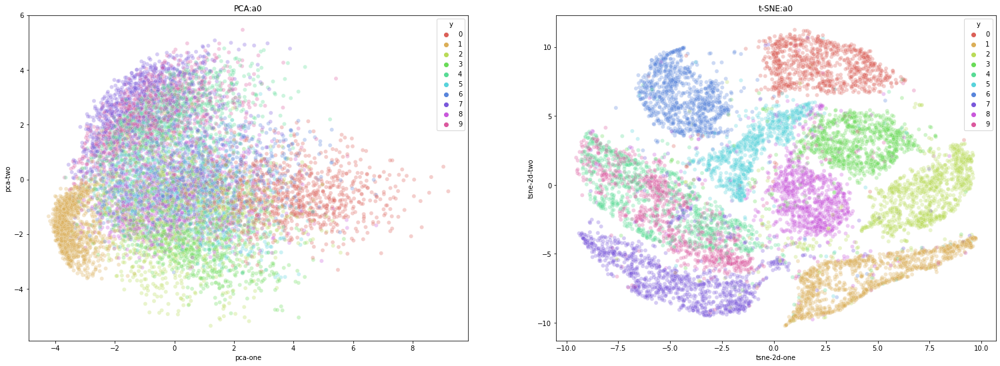

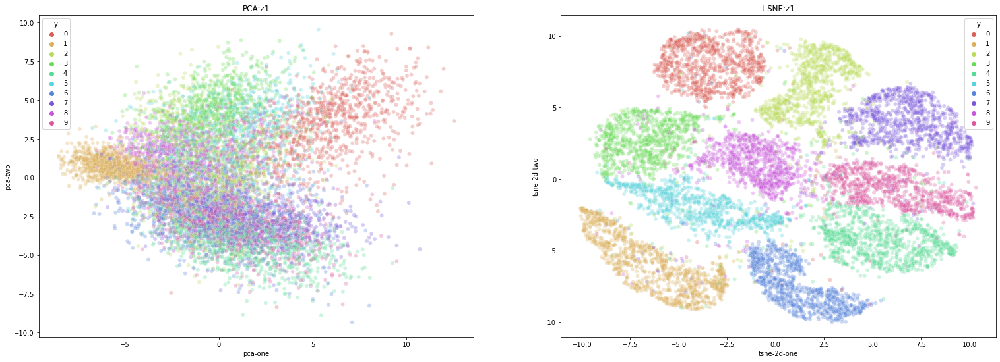

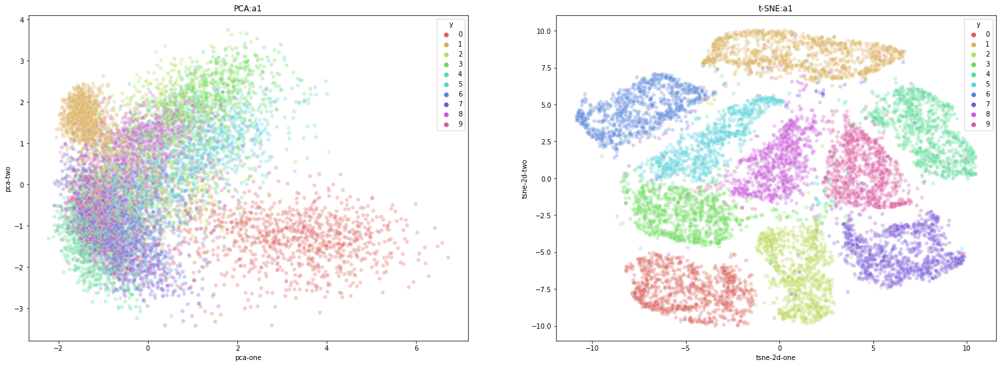

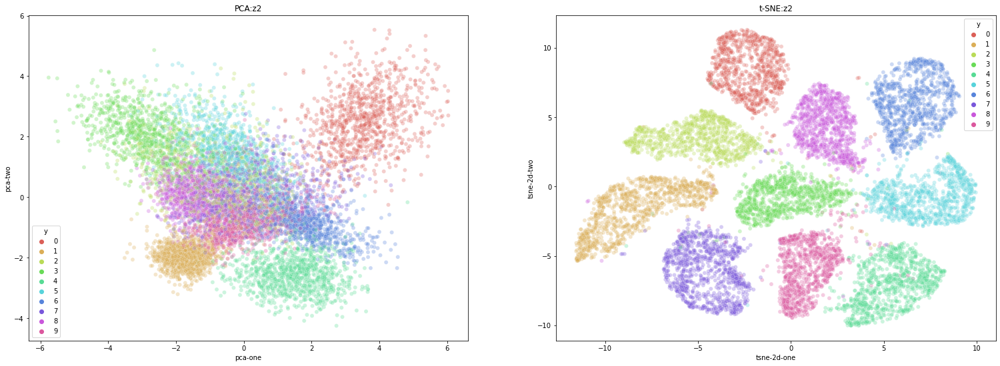

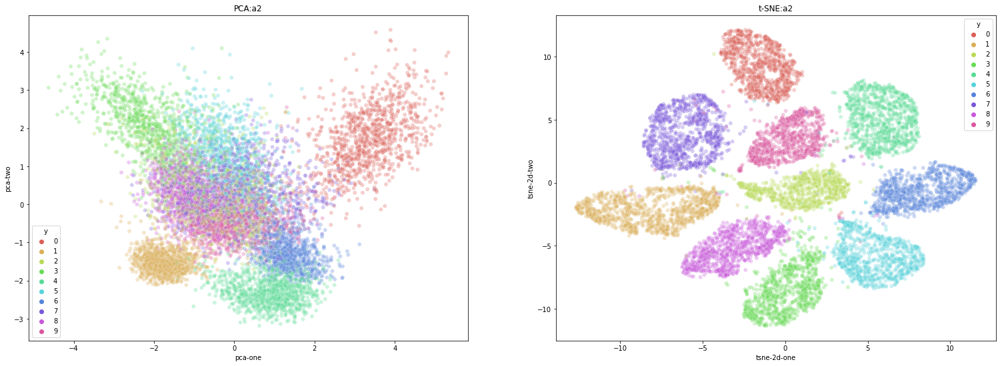

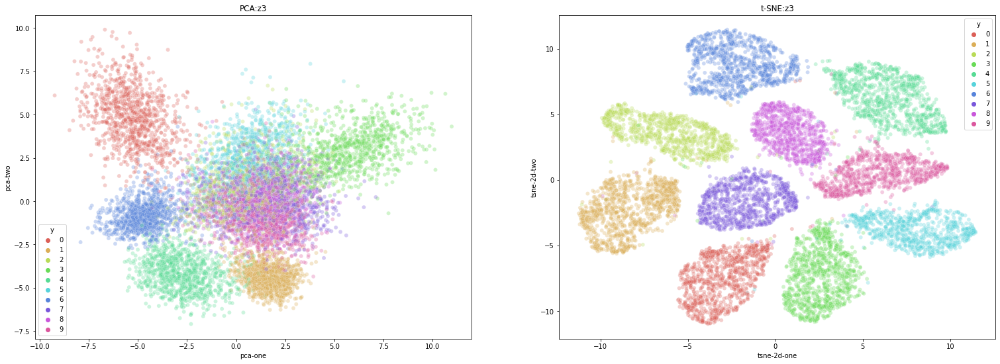

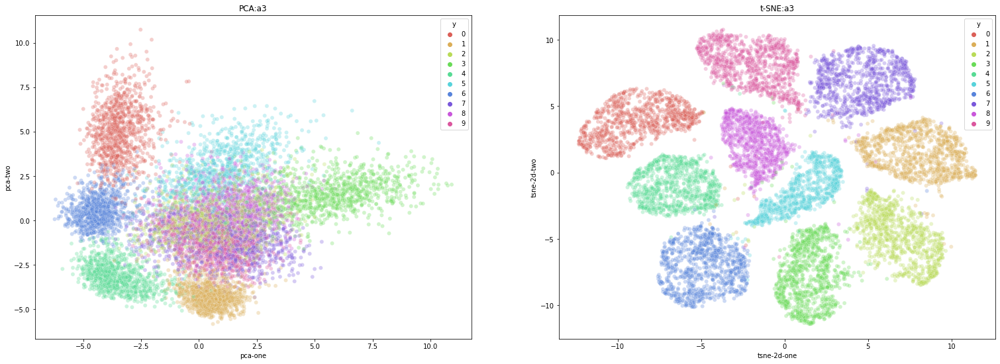

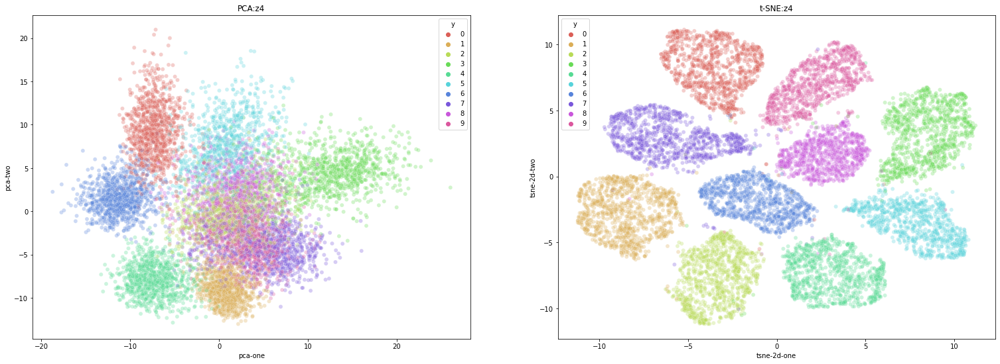

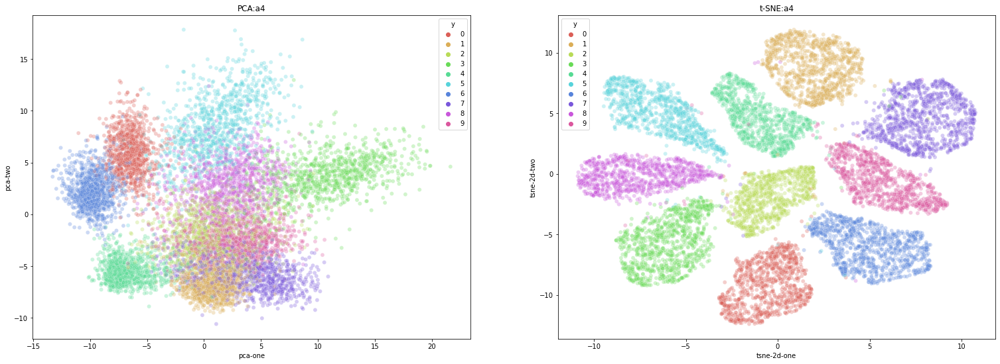

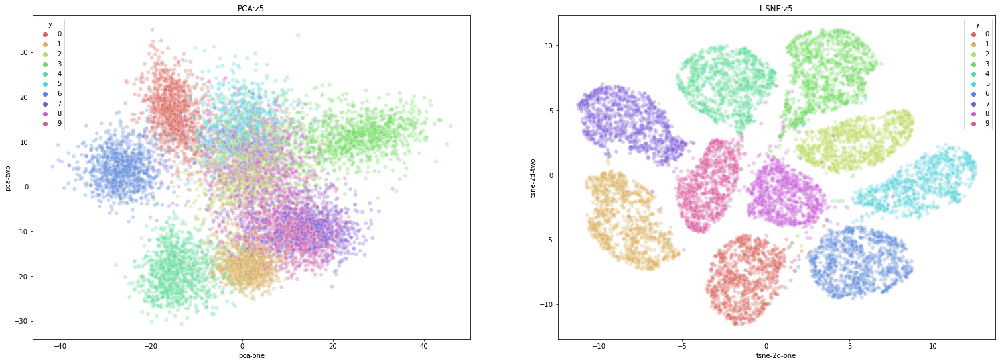

In [93]:
for i in range(10):
    visual.draw(i,n_list[i])

In [94]:
# N = 1000 # subset size
# N = 30000 # subset size
N = 5000 # subset size
visual_5000 = visualization(label_list, N)
for i in range(10):
    visual_5000.compression(model_ML.az[i], i)

Explained variation per principal component:[0.095258  0.0725312]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.485s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 2.297857
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.980347
[t-SNE] KL divergence after 300 iterations: 2.111859
t-SNE done! Time elapsed: 4.6795759201049805 seconds
Explained variation per principal component:[0.15445102 0.12597376]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.002s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.519s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 2.450411
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.136978
[t-SNE] KL divergence after 300 iterations: 1.996557
t-SNE done! Time elapsed: 5.017427444458008 seconds
Explained variation per principal component:[0.12059689 0.10216992]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.509s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.291343
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.429520
[t-SNE] KL divergence after 300 iterations: 1.893311
t-SNE done! Time elapsed: 4.852745532989502 seconds
Explained variation per principal component:[0.24504413 0.18379426]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.491s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.839823
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.149963
[t-SNE] KL divergence after 300 iterations: 1.790207
t-SNE done! Time elapsed: 4.736208438873291 seconds
Explained variation per principal component:[0.23062147 0.18188487]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.501s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.704188
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.302132
[t-SNE] KL divergence after 300 iterations: 1.771204
t-SNE done! Time elapsed: 4.690440893173218 seconds
Explained variation per principal component:[0.28330439 0.22300968]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.486s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.992650
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.417145
[t-SNE] KL divergence after 300 iterations: 1.744941
t-SNE done! Time elapsed: 4.639248609542847 seconds
Explained variation per principal component:[0.27872805 0.22285464]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.421s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.908582
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.915367
[t-SNE] KL divergence after 300 iterations: 1.716340
t-SNE done! Time elapsed: 4.656967401504517 seconds
Explained variation per principal component:[0.30577496 0.24011666]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.448s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.781143
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.875198
[t-SNE] KL divergence after 300 iterations: 1.718206
t-SNE done! Time elapsed: 4.697691917419434 seconds
Explained variation per principal component:[0.28748551 0.2238584 ]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.477s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.605659
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.121647
[t-SNE] KL divergence after 300 iterations: 1.669526
t-SNE done! Time elapsed: 4.954783916473389 seconds
Explained variation per principal component:[0.34661469 0.25414923]
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.016s...


D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\develop\Anaconda\envs\ai21\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 5000 samples in 0.252s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 3.213558
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.773106
[t-SNE] KL divergence after 300 iterations: 1.708705
t-SNE done! Time elapsed: 4.438629627227783 seconds


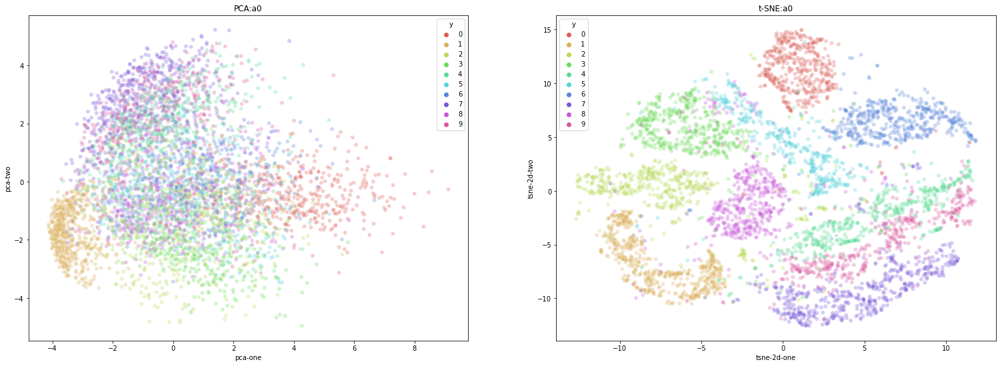

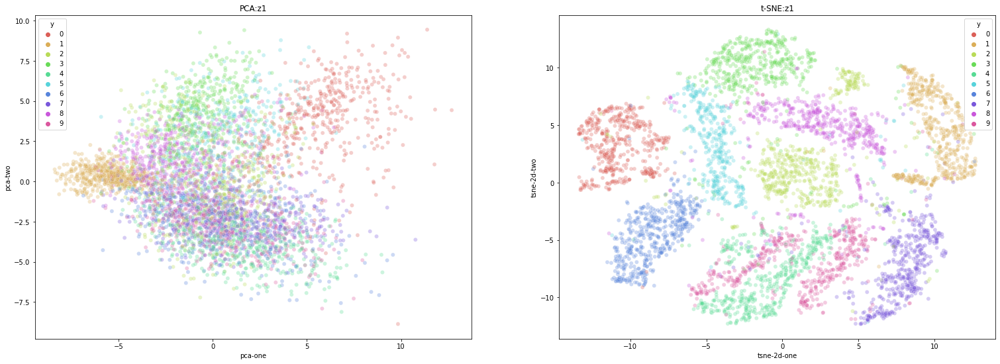

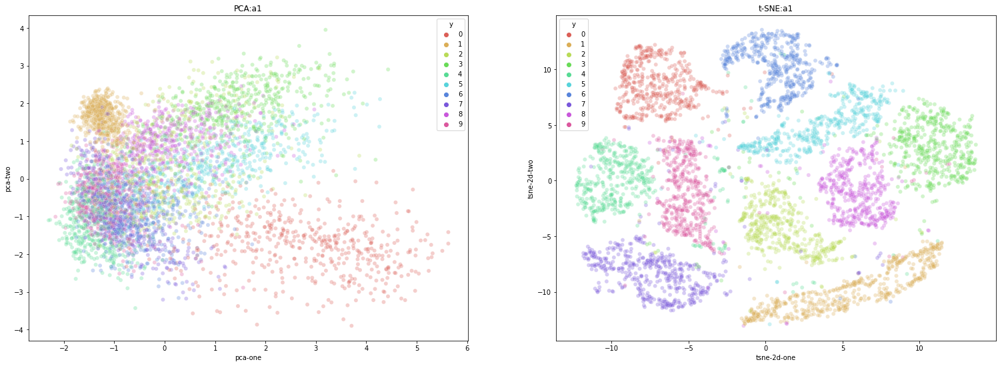

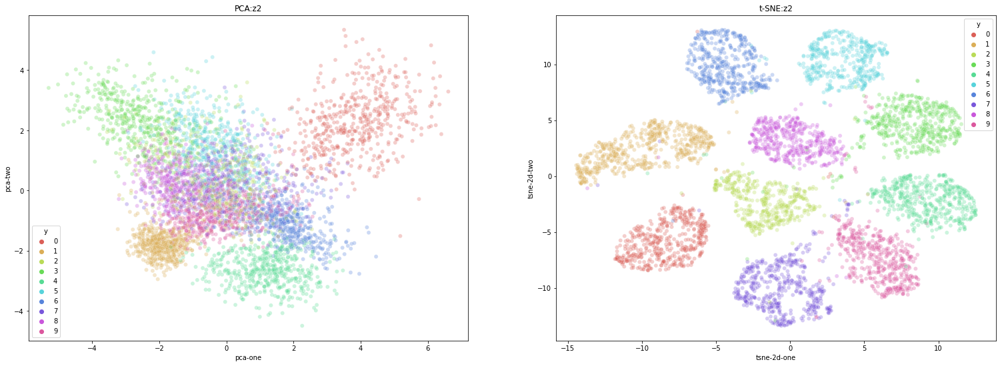

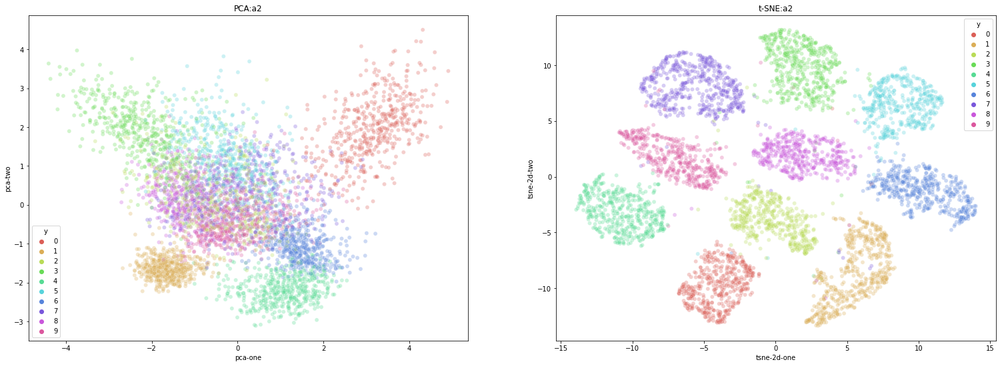

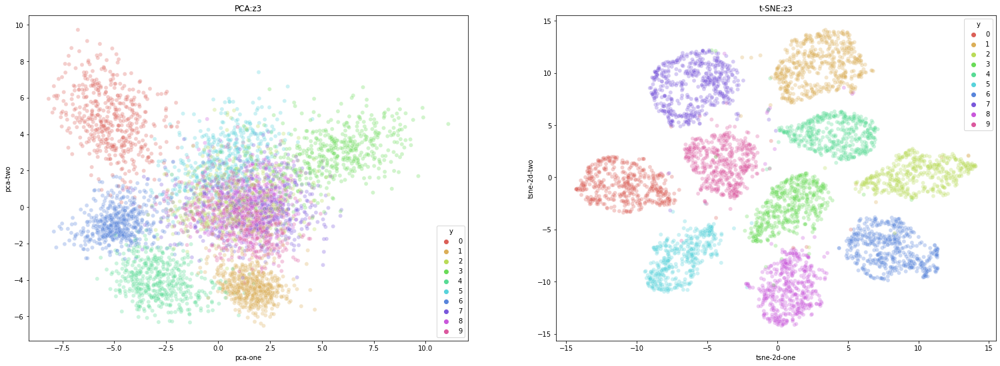

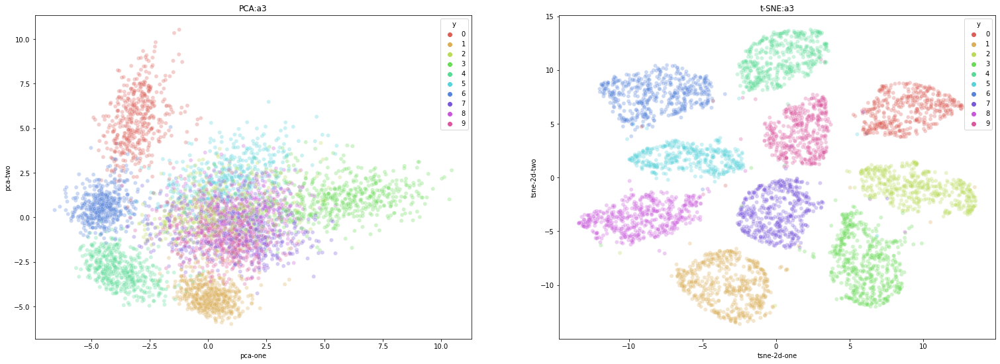

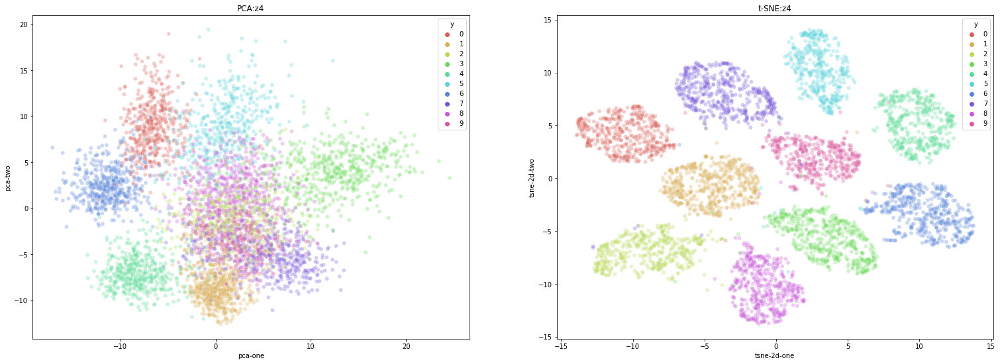

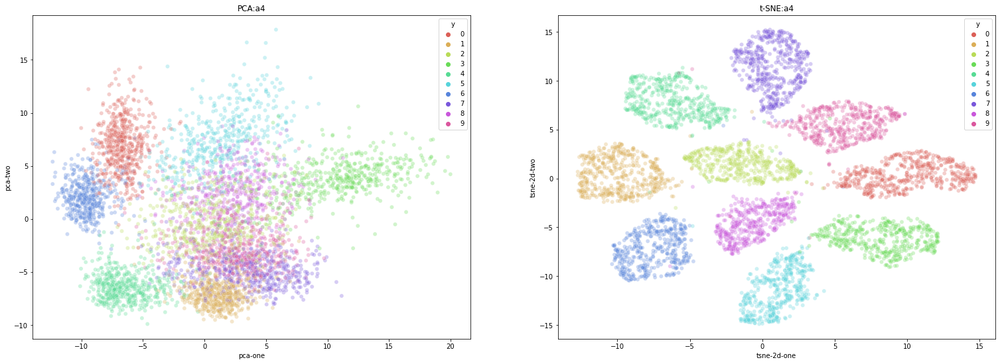

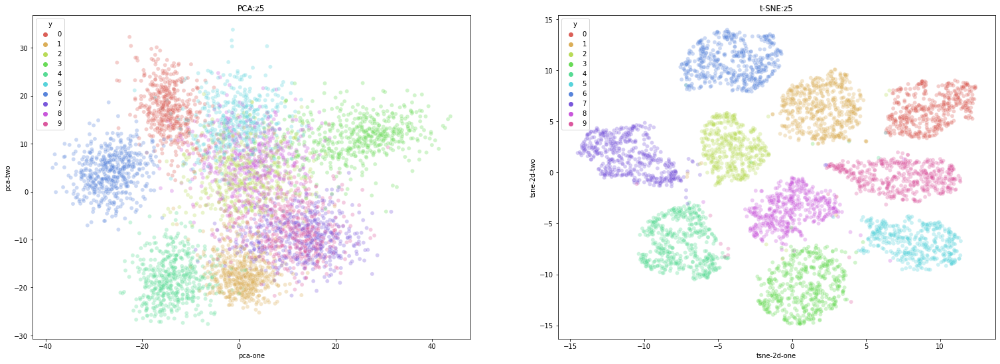

In [95]:
for i in range(10):
    visual_5000.draw(i,n_list[i])

TEST

In [96]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


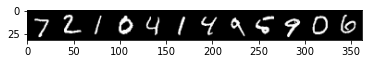

GroundTruth
    7    2    1    0    4    1    4    9    5    9    0    6
Prediction
    7    2    1    0    4    1    4    9    6    9    0    6


In [97]:
dataiter = iter(test_loader)
images, labels = dataiter.next()

imshow(torchvision.utils.make_grid(images, nrow = batch_size))
print('GroundTruth')
print("  "+'  '.join('%3s' % label.item() for label in labels))
model_ML.epochs = 10
outputs = model_ML(images) 
_, predicted = torch.max(outputs, 1) 
print("Prediction")
print("  "+'  '.join('%3s' % label.item() for label in predicted))


In [98]:
n_predict = 0
n_correct = 0
model_ML.epochs = 10
for data in test_loader:
    inputs, labels = data
    outputs = model_ML(inputs)
    _, predicted = torch.max(outputs, 1)

    n_predict += len(predicted)
    n_correct += (labels == predicted).sum()

print(f"{n_correct}/{n_predict}")
print(f"Accuracy:{n_correct/n_predict:.3f}")



9744/10000
Accuracy:0.974
